# (19) fit — iterative pvae

**Motivation**: host = ```mach```, device = ```cuda:0``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
# sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
sys.path.insert(0, os.path.join(git_dir, '_IterativeVAE'))
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
warnings.filterwarnings('ignore', category=FutureWarning)
warnings.filterwarnings('ignore', category=UserWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
from base.utils_model import load_quick

device_idx = 0
device = f'cuda:{device_idx}'

## vH16

### Get configs

In [3]:
model_type = 'poisson'
cfg_vae, cfg_tr = default_configs('MNIST', model_type, 'jac|mlp+b')

cfg_vae['n_latents'] = [128]
cfg_vae['init_scale'] = 1e-2
cfg_vae['seq_len'] = 10

cfg_tr['lr'] = 2e-3
cfg_tr['epochs'] = 500
cfg_tr['batch_size'] = 200
cfg_tr['kl_beta'] = 5.0
cfg_tr['kl_balancer'] = None

print(f"VAE:\n{cfg_vae}\n\nTrainer:\n{cfg_tr}")

VAE:
{'dataset': 'MNIST', 'n_latents': [128], 'prior_clamp': -2, 'enc_type': 'jac', 'dec_type': 'mlp', 'enc_bias': 
False, 'dec_bias': True, 'init_dist': 't', 'init_scale': 0.01, 'seq_len': 10}

Trainer:
{'epochs': 500, 'batch_size': 200, 'warm_restart': 2, 'optimizer_kws': {'weight_decay': 0.0003}, 'grad_clip': 1000,
'kl_const_portion': 0.01, 'lr': 0.002, 'kl_beta': 5.0, 'kl_balancer': None}

### Make model + trainer

In [4]:
vae = HIPVAE(CFG_CLASSES[model_type](**cfg_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**cfg_tr), device=device)

### Print info

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|    HIPVAE   |  467.4 K   |
|     ———     |    ———     |
|  layers.L_0 |  467.4 K   |
+-------------+------------+

poisson_uniform_c(-2)_MNIST_t-10_z-[128]_k-32_<jac|mlp+b>
mc_b200-ep500-lr(0.002)_beta(5:0x0.5)_temp(0.05:lin-0.5)_gr(1000)_(2024_09_02,14:07)

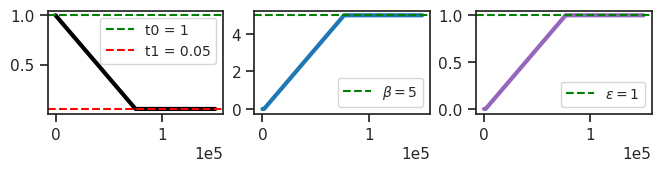

In [5]:
vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}_({vae.timestamp})\n")
tr.show_schedules()

In [6]:
print_num_params(tr.model.input_layer)

+--------------+------------+
| Module Name  | Num Params |
+--------------+------------+
| PoissonLayer |  467.4 K   |
|     ———      |    ———     |
|     dec      |  467.1 K   |
+--------------+------------+

In [7]:
print(tr.model.input_layer.dec)

Sequential(
  (0): Linear(in_features=128, out_features=234, bias=True)
  (1): SiLU(inplace=True)
  (2): Linear(in_features=234, out_features=428, bias=True)
  (3): SiLU(inplace=True)
  (4): Linear(in_features=428, out_features=784, bias=True)
)

### Fit model

In [8]:
tr.train(fit_name=f"d/dz(mse)_{tr.cfg.name()}")

epoch # 500, avg loss: 18.319161: 100%|████████████████████████████████████████████████████████| 500/500 [3:52:47<00:00, 27.93s/it]


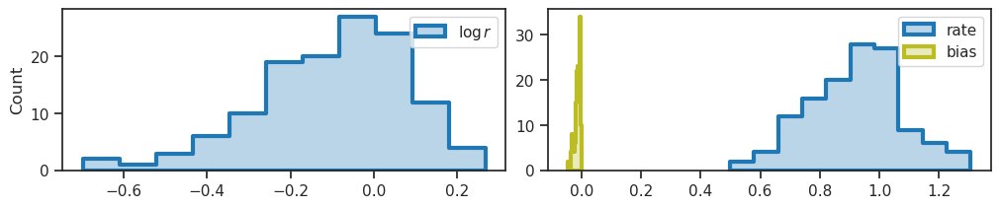

In [9]:
log_rate = tonp(tr.model.input_layer.log_rate).ravel()
bias = tonp(tr.model.input_layer.bias).ravel()

fig, axes = create_figure(1, 2, (10, 2))
kws = dict(fill=True, lw=3, alpha=0.3, ax=axes[0])
sns.histplot(log_rate, color='C0', element='step', label=r'$\log r$', **kws)

kws = dict(fill=True, lw=3, alpha=0.3, ax=axes[1])
sns.histplot(np.exp(log_rate), color='C0', element='step', label='rate', **kws)
sns.histplot(bias, color='C8', element='step', label='bias', **kws)

axes[1].set(ylabel='')
add_legend(axes)

plt.show()

In [10]:
data, loss, etc = tr.validate(full_data=True)
kl_diag = loss['kl_diag'].copy()
loss = {
    k: np.mean(v, 0) for k, v in
    loss.items() if k != 'kl_diag'
}
print(loss)

{
    'kl': array([5.740131  , 5.310614  , 3.2851446 , 1.7418436 , 1.0992291 ,
       0.794161  , 0.640946  , 0.5436524 , 0.48089233, 0.43839708],
      dtype=float32),
    'recon': array([42.705544, 26.14993 , 18.058681, 14.654064, 12.759987, 11.593951,
       10.798836, 10.248602,  9.862446,  9.562863], dtype=float32),
    'nelbo': array([48.445786, 31.460562, 21.343754, 16.395868, 13.859231, 12.388138,
       11.439722, 10.792253, 10.343305, 10.001259], dtype=float32)
}

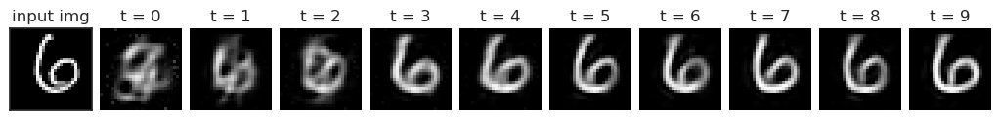

In [13]:
sample_i = 100

shape = (tr.model.cfg.input_sz,) * 2
ncols = 1 + tr.model.cfg.seq_len
fig, axes = create_figure(1, ncols, (0.92 * ncols, 1.3), 'all', 'all')

ax = axes[0]
x2p = data['x'][sample_i].reshape(shape)
kws = dict(vmin=x2p.min(), vmax=x2p.max(), cmap='Greys_r')
ax.imshow(x2p, **kws)
ax.set_title('input img')

for t in range(tr.model.cfg.seq_len):
    ax = axes[t + 1]
    ax.imshow(data['y'][sample_i, t].reshape(shape), **kws)
    ax.set_title(f"t = {t}")
remove_ticks(axes[1:])
ax_square(axes);

### Analysis

In [11]:
results = tr.analysis(5000, verbose=True)

100%|█████████████████████████████████| 50/50 [14:21<00:00, 17.23s/it]


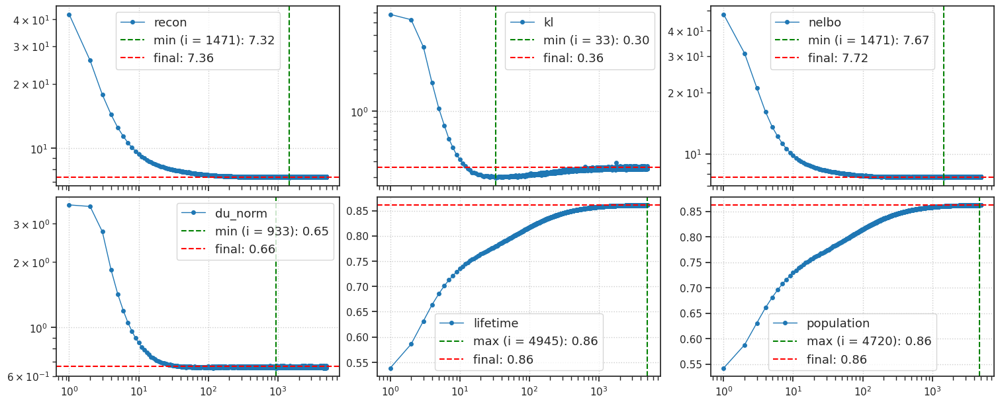

In [12]:
from figures.analysis import plot_convergence
plot_convergence(results)

### Generate fake samples

In [14]:
self = tr.model.input_layer
self.reset_state(64)

dist, z, pred = self.generate(0.0)

output = tr.model.generate(pred, seq=range(300))
output = output.stack()

loss_kl = tonp(torch.sum(output['loss_kl'], -1))
u = tr.model.input_layer.log_rate.expand(len(pred), -1)
desc_len = tr.model.input_layer.loss_kl(u=u)
desc_len = tonp(torch.sum(desc_len, dim=-1))

list(output)

['recon', 'ff', 'fb', 'spks', 'dist', 'loss_kl', 'loss_recon']

In [15]:
shape = (tr.model.cfg.input_sz, tr.model.cfg.input_sz)

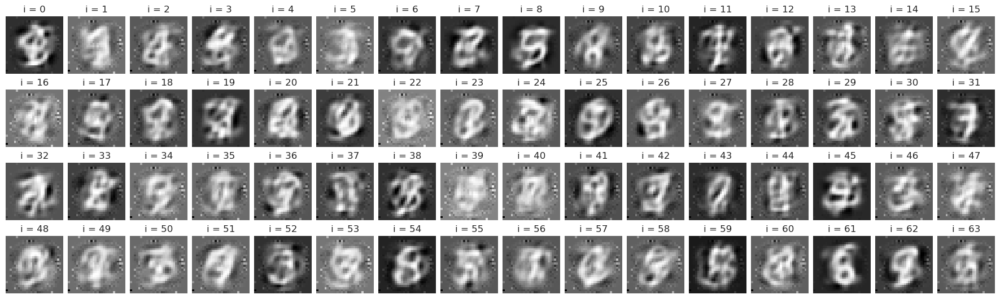

In [16]:
nrows = 4
ncols = int(np.ceil(len(pred) / nrows))
fig, axes = create_figure(nrows, ncols, (1.1 * ncols, 1.3 * nrows), 'all', 'all')
for sample_i, ax in enumerate(axes.flat):
    i, j = sample_i // ncols, sample_i % ncols
    x2p = tonp(pred[sample_i].reshape(shape))
    ax.imshow(x2p, cmap='Greys_r')
    ax.set_title(f"i = {sample_i}")
trim_axs(axes, len(pred))
remove_ticks(axes)
plt.show()

In [23]:
sample_i = 35

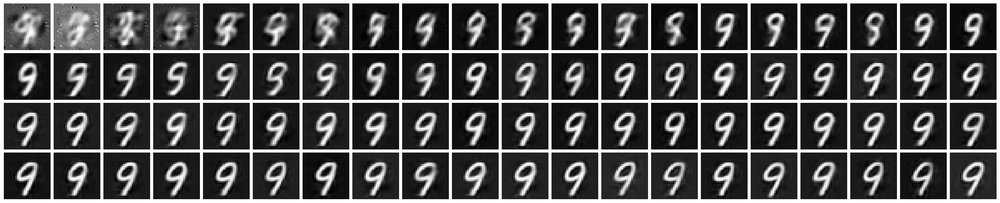

In [24]:
nrows, ncols = 4, 20
fig, axes = create_figure(nrows, ncols, (1.3 * ncols, 1.3 * nrows), 'all', 'all')
for idx, ax in enumerate(axes.flat):
    i, j = idx // ncols, idx % ncols
    x2p = tonp(output['recon'][sample_i, idx].reshape(shape))
    ax.imshow(x2p, cmap='Greys_r')
remove_ticks(axes)

In [26]:
order = np.argsort(desc_len)

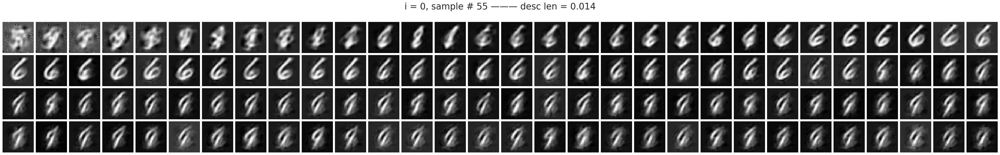

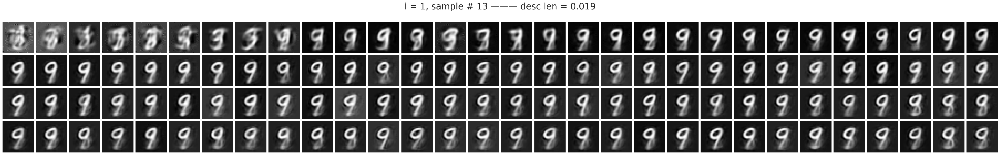

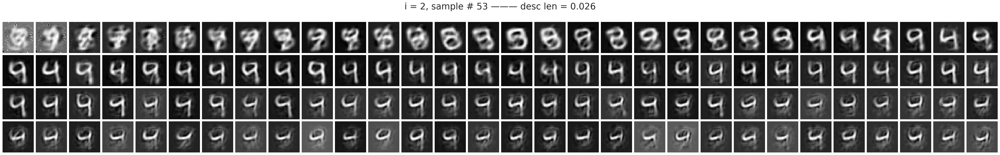

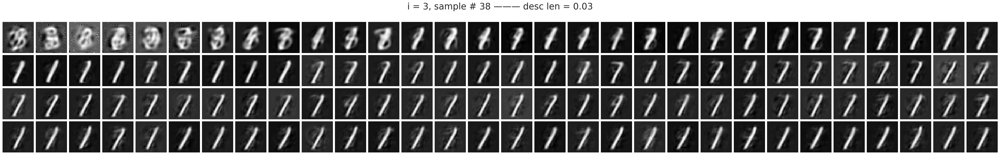

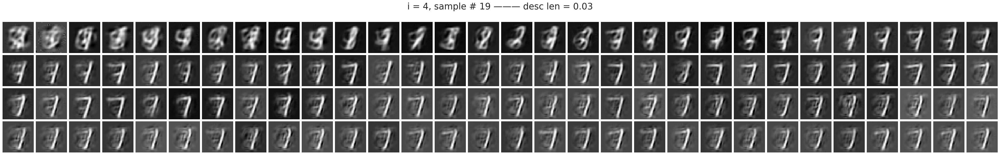

...

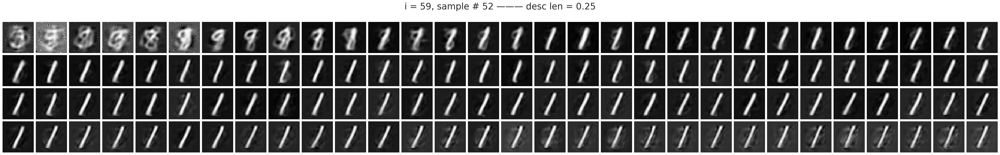

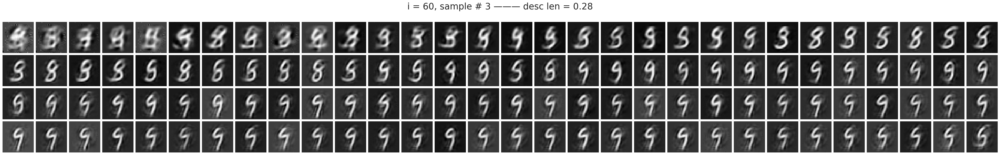

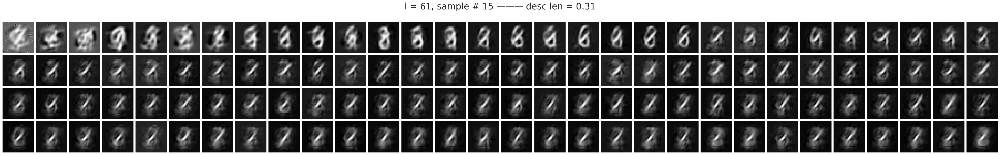

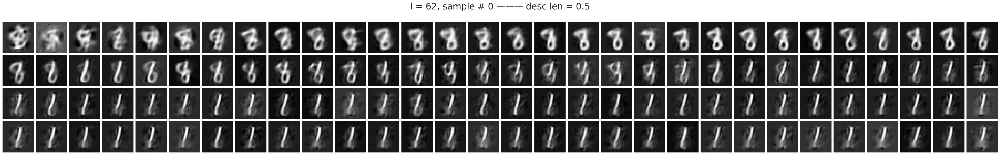

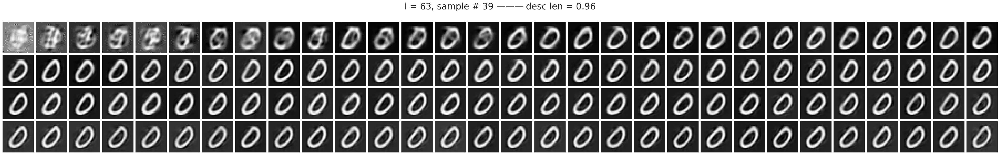

In [27]:
for i in range(len(pred)):
    sample_i = order[i]
    nrows, ncols = 4, 30
    fig, axes = create_figure(nrows, ncols, (1.3 * ncols, 1.3 * nrows), 'all', 'all')
    tit = ' ——— '.join([
        f"i = {i}, sample # {sample_i}",
        f"desc len = {desc_len[sample_i]:0.2g}",
    ])
    fig.suptitle(tit, fontsize=25, y=1.14)
    
    x2p = tonp(pred[sample_i].reshape(shape))
    axes[0, 0].imshow(x2p, cmap='Greys_r')
    
    for idx, ax in enumerate(axes.flat[1:], start=1):
        i, j = idx // ncols, idx % ncols
        x2p = tonp(output['recon'][sample_i, idx - 1].reshape(28, 28))
        ax.imshow(x2p, cmap='Greys_r')
    remove_ticks(axes)
    plt.show()

In [28]:
du_norm = tonp(torch.linalg.vector_norm(
    output['ff'], dim=-1))

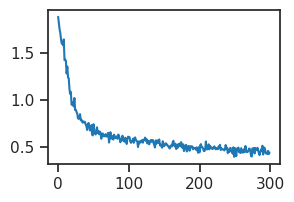

In [29]:
plt.plot(du_norm.mean(0));